In [1]:
import glob
from general import *
from generation import *
from storage import *
from system import *
from copy import deepcopy

sys.path.insert(0, '/projects/wg-ASGARD/bin/spt_dev/SolarPILOT/deploy/api/')
from copylot import CoPylot

import os
import seaborn as sns
import numpy as np
import pickle
import math
import matplotlib.pyplot as plt

In [2]:
import warnings

warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
CAPEX_BES_INV_USDpkW = 63.48  # Cost per kW for BES inverter
CAPEX_BES_CAPACITY_USDpkWh = 184.37  # Cost per kWh for BES capacity
CAPEX_BES_BOS_USDpkWh = 35.54  # Balance of system cost per kWh
C_OM_Battery = 9870  # Annual O&M cost per MW for BES
CAPEX_TES_HEATER_USDpkW = 40.84  # Cost per kW for TES heater
CAPEX_TES_SHELL_USDpkW = 125  # Cost per kW for TES shell
CAPEX_TES_CONTROLLER_USDpkW = 15.625  # Cost per kW for TES controller
C_OM_TES = 50000 

In [30]:
bes = Storage_System(name='bes',
                        capacity_MWh = 150,
                        power_rating_MW = 35,
                        percent_discharge_depth = 80,
                        percent_heat_loss_daily = 0,
                        charge_rate_resistive_MW = None,
                        charge_efficiency = .92,
                        discharge_efficiency = .92,
                        off_grid_operation = True,)

In [5]:
bes.capex = (
    bes.capacity_MWh * (CAPEX_BES_CAPACITY_USDpkWh + CAPEX_BES_BOS_USDpkWh)
    + bes.power_rating_MW * CAPEX_BES_INV_USDpkW
)

bes.opex = bes.capacity_MWh * C_OM_Battery

In [6]:
print(f"Name: {bes.name}")
print(f"Capacity: {bes.capacity_MWh} MWh")
print(f"Power Rating: {bes.power_rating_MW} MW")
print(f"Capex: ${bes.capex:.2f}")
print(f"Opex: ${bes.opex:.2f}")
print()

Name: ASGARD_BES
Capacity: 150 MWh
Power Rating: 35 MW
Capex: $35208.30
Opex: $1480500.00



In [7]:
tes = Storage_System(name='tes',
                        capacity_MWh = 1800,
                        power_rating_MW = 50,
                        percent_discharge_depth = 95,
                        percent_heat_loss_daily = 1,
                        charge_rate_resistive_MW = None,
                        charge_efficiency = .92,
                        discharge_efficiency = .92,
                        off_grid_operation = True)

In [8]:
mult = 1
if tes.capacity_MWh <= 4200:
    C_TES = (-9.1825e-7*tes.capacity_MWh**2 + 2.27534e-2*tes.capacity_MWh + 2.42186)*1e6
else:
    slope = ((-9.1825e-7 * 4200**2 + 2.27534e-2 * 4200 + 2.42186) * 1e6 - (-9.1825e-7 * 3800**2 + 2.27534e-2 * 3800 + 2.42186) * 1e6) / (4200 - 3800)
    C_TES = (-9.1825e-7 * 4200**2 + 2.27534e-2 * 4200 + 2.42186) * 1e6 + slope * (tes.capacity_MWh_t - 4200)

C_hx = 211000 * tes.power_rating_MW
C_pb = 1850000 * tes.power_rating_MW

C_TES*mult+C_hx*mult+C_pb*mult
#C_TES*mult+C_hx*mult+C_heater+C_pb*mult+C_skip*mult+C_tr*mult

143452850.0

In [9]:
tes.capex = (
    tes.power_rating_MW * (CAPEX_TES_HEATER_USDpkW + CAPEX_TES_SHELL_USDpkW + CAPEX_TES_CONTROLLER_USDpkW)
)

# Calculate annual O&M cost for TES
tes.opex = tes.power_rating_MW * C_OM_TES

In [10]:
print(f"Name: {tes.name}")
print(f"Capacity: {tes.capacity_MWh} MWh")
print(f"Power Rating: {tes.power_rating_MW} MW")
print(f"Capex: ${tes.capex:.2f}")
print(f"Opex: ${tes.opex:.2f}")

Name: tes
Capacity: 1800 MWh
Power Rating: 50 MW
Capex: $9073.25
Opex: $2500000.00


In [11]:
power_timeseries = None

pv = Power_System(
    name="pv",
    power_type="DC",
    energy_type= "electric",
    capacity_MW = 50,
    off_grid_operation=False,
    power_timeseries=power_timeseries,
    capex=150000000,  # USD
    opex=5000000,  # USD/year
    land_area=500  # Acres
)

In [12]:
Kfiles = glob.glob('/projects/wg-ASGARD/weather_data/KAFB/*2013*')
site = Site('NSTTF',Weather_Data(Kfiles),-7)

In [13]:
solar_position = site.location.get_solarposition(site.weather_data.dataframe.index)

poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=30,
    surface_azimuth=180,
    dni=site.weather_data.dataframe.dni,
    ghi=site.weather_data.dataframe.ghi,
    dhi=site.weather_data.dataframe.dhi,
    solar_zenith=solar_position.apparent_zenith,
    solar_azimuth=solar_position.azimuth,
    model = 'isotropic')

In [14]:
poa

,poa_global,poa_direct,poa_diffuse,poa_sky_diffuse,poa_ground_diffuse
2013-01-01 00:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 01:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 02:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 03:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 04:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 05:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 06:30:00-07:00,0.000000,0.000000,0.000000,0.000000,0.000000
2013-01-01 07:30:00-07:00,294.365766,279.901665,14.464102,13.995191,0.468911
2013-01-01 08:30:00-07:00,575.700752,534.064373,41.636379,38.253521,3.382859
2013-01-01 09:30:00-07:00,526.471457,471.641244,54.830213,48.516660,6.313553


In [15]:
dfpv = site.weather_data.dataframe.copy()
#dc calculation
dfpv['irradiance_poa_global_Wpm2'] = poa.poa_global
dfpv['temperature_module_C'] = pvlib.temperature.faiman(dfpv['irradiance_poa_global_Wpm2'], dfpv.temp_air, dfpv.wind_speed)
dfpv['power_MW_DC'] = pvlib.pvsystem.pvwatts_dc(dfpv['irradiance_poa_global_Wpm2'], dfpv['temperature_module_C'], pv.capacity_MW, gamma, temp_ref)

#ac calculation for for all systems
dfpv['power_MW_DC'] = dfpv['power_MW_DC'].replace(np.nan,0)
dfpv['power_MW_AC'] = dfpv['power_MW_DC'].clip(upper=pv.capacity_MW * 1.25,inplace=False)

In [31]:
dfpv

,Year,Month,Day,Hour,Minute,temp_air,dhi_clear,dni_clear,ghi_clear,Cloud Type,temp_dew,dhi,dni,Fill Flag,ghi,relative_humidity,solar_zenith,albedo,pressure,precipitable_water,wind_direction,wind_speed,Global Horizontal UV Irradiance (280-400nm),Global Horizontal UV Irradiance (295-385nm),irradiance_poa_global_Wpm2,temperature_module_C,power_MW_DC,power_MW_AC
2013-01-01 00:30:00-07:00,2013,1,1,0,30,-3.1,0.0,0.0,0.0,1,-9.6,0.0,0.0,0,0.0,60.93,167.14,0.18,845.0,0.5,295.0,1.7,0.0000,0.0000,0.000000,-3.100000,0.000000,0.000000
2013-01-01 01:30:00-07:00,2013,1,1,1,30,-3.8,0.0,0.0,0.0,0,-9.8,0.0,0.0,0,0.0,62.86,158.84,0.18,846.0,0.5,302.0,1.6,0.0000,0.0000,0.000000,-3.800000,0.000000,0.000000
2013-01-01 02:30:00-07:00,2013,1,1,2,30,-4.7,0.0,0.0,0.0,1,-10.2,0.0,0.0,0,0.0,65.31,147.35,0.18,846.0,0.4,304.0,1.4,0.0000,0.0000,0.000000,-4.700000,0.000000,0.000000
2013-01-01 03:30:00-07:00,2013,1,1,3,30,-5.4,0.0,0.0,0.0,0,-10.5,0.0,0.0,0,0.0,67.36,135.18,0.18,846.0,0.4,304.0,1.1,0.0000,0.0000,0.000000,-5.400000,0.000000,0.000000
2013-01-01 04:30:00-07:00,2013,1,1,4,30,-6.2,0.0,0.0,0.0,1,-10.7,0.0,0.0,0,0.0,70.52,122.93,0.18,846.0,0.4,301.0,1.0,0.0000,0.0000,0.000000,-6.200000,0.000000,0.000000
2013-01-01 05:30:00-07:00,2013,1,1,5,30,-6.8,0.0,0.0,0.0,1,-10.8,0.0,0.0,0,0.0,73.17,110.86,0.18,847.0,0.4,295.0,1.0,0.0000,0.0000,0.000000,-6.800000,0.000000,0.000000
2013-01-01 06:30:00-07:00,2013,1,1,6,30,-7.3,0.0,0.0,0.0,1,-10.9,0.0,0.0,0,0.0,75.41,99.19,0.18,847.0,0.4,292.0,1.0,0.0000,0.0000,0.000000,-7.300000,0.000000,0.000000
2013-01-01 07:30:00-07:00,2013,1,1,7,30,-6.1,15.0,335.0,28.0,1,-11.0,15.0,335.0,0,28.0,68.35,87.88,0.18,848.0,0.4,299.0,1.6,0.0000,0.0000,294.365766,2.089566,15.729895,15.729895
2013-01-01 08:30:00-07:00,2013,1,1,8,30,-3.5,41.0,773.0,202.0,0,-11.0,41.0,773.0,0,202.0,56.02,77.99,0.18,848.0,0.3,312.0,2.7,9.6675,7.3889,575.700752,9.744243,30.102450,30.102450
2013-01-01 09:30:00-07:00,2013,1,1,9,30,-1.1,52.0,920.0,377.0,0,-11.8,52.0,920.0,0,377.0,44.11,69.34,0.18,848.0,0.3,321.0,3.3,19.4134,15.0457,526.471457,9.966835,27.510753,27.510753


In [16]:
csp = Power_System(
    name="csp",
    power_type="DC",
    energy_type="thermal",
    capacity_MW = 50,
    off_grid_operation=False,
    power_timeseries=power_timeseries,
    capex=150000000,  # USD
    opex=5000000,  # USD/year
    land_area=500  # Acres
)

In [17]:
csp_config = {'thermal_power_MW_t': 100,
          'power_rating_MW_e': 50,
          'dni_des':950,
          'tower_height_m': 117,
          'receiver_width_m':5,
          'receiver_height_m':5,
          'accept_ang_y':180,
          'accept_ang_x':180,
          'heliostat_width_m':5,
          'heliostat_height_m':5,
          'field_max_scaled_rad':8,
          'layout_method':'Radial Stagger',
          'field_shape':'Hexagon',
          'interaction_limit':50,
          'row_spacing_x':1.5,
          'row_spacing_y':1.5}

In [24]:
cp = CoPylot();
r = cp.data_create();

## Ambient Setup
""" Setup the model & optimize field"""
cp.data_set_string(r,'ambient.0.weather_file','/projects/wg-ASGARD/weather_data/KAFB/443653_35.09_-106.66_2013.csv')
cp.data_set_string(r, "ambient.0.sun_type", "Gaussian sun")
cp.data_set_string(r, "ambient.0.atm_model", "DELSOL3 clear day")
cp.data_set_number(r, "ambient.0.sun_rad_limit", 2.73)

## Flux Sim Setup
cp.data_set_string(r, "fluxsim.0.flux_model", "Hermite (analytical)")
cp.data_set_string(r, "fluxsim.0.aim_method", "Simple aim points")


## Heliostat setup
cp.data_set_string(r,'heliostat.0.focus_method',"At slant")
cp.data_set_number(r,'heliostat.0.width', 5)
cp.data_set_number(r,'heliostat.0.height', 5)
cp.data_set_number(r,'heliostat.0.reflectivity',0.94)
cp.data_set_number(r,'heliostat.0.track_period',1)
#cp.data_set_number(r,'heliostat.0.cant_radius',200)


## Land Setup
cp.data_set_number(r,'land.0.max_scaled_rad', 8)
cp.data_set_number(r,'land.0.min_scaled_rad',0.75)
cp.data_set_number(r,'land.0.land_mult',1.0)
cp.data_set_number(r,'land.0.land_const',7)

## Receiver setup
cp.data_set_number(r, "receiver.0.rec_type",2)
cp.data_set_number(r, "receiver.0.therm_loss_base", 0)
cp.data_set_number(r, "receiver.0.piping_loss_coef", 0)
cp.data_set_number(r, "receiver.0.peak_flux", 100000)
cp.data_set_number(r, "receiver.0.rec_width", 5)
cp.data_set_number(r, "receiver.0.rec_height", 5)
cp.data_set_number(r, "receiver.0.absorptance", 1)
cp.data_set_string(r, "receiver.0.accept_ang_type", "Rectangular")
cp.data_set_number(r, "receiver.0.accept_ang_x", 180)
cp.data_set_number(r, "receiver.0.accept_ang_y", 180)
cp.data_set_number(r, "receiver.0.rec_azimuth", 0)
cp.data_set_number(r, "receiver.0.rec_offset_x", 0)

## Solar Field Setup
cp.data_set_string(r, "solarfield.0.des_sim_detail", "Representative profiles")
cp.data_set_string(r, "solarfield.0.hsort_method", "Power to receiver")
cp.data_set_string(r, "solarfield.0.layout_method", "Radial Stagger")
cp.data_set_string(r, "solarfield.0.sun_loc_des", "Summer solstice")
cp.data_set_string(r, "solarfield.0.xy_field_shape", "Hexagon")
cp.data_set_number(r, "solarfield.0.interaction_limit", 50)
cp.data_set_number(r, "solarfield.0.des_sim_nhours", 5)
cp.data_set_number(r,'solarfield.0.row_spacing_x', 1.5)
cp.data_set_number(r,'solarfield.0.row_spacing_y', 1.5)
cp.data_set_number(r,'solarfield.0.q_des', 100)
cp.data_set_number(r,'solarfield.0.dni_des', 950)
cp.data_set_number(r,'solarfield.0.tht', 117) 
cp.generate_layout(r)

field = cp.get_layout_info(r)

area_land_acres = cp.data_get_number(r,'land.0.land_area')
area_heliostat_total_m2 = cp.data_get_number(r,'solarfield.0.sf_area')

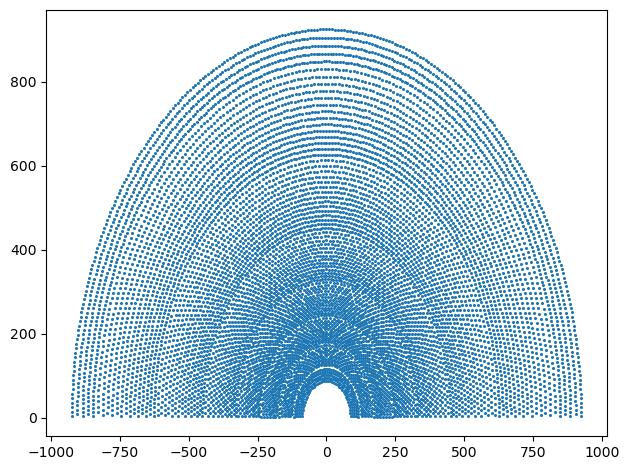

In [27]:
plt.scatter(field['x_location'], field['y_location'], s=1.5)
plt.tight_layout()
plt.show()